In [ ]:
#@title Install the facets_overview pip package.
!pip install facets-overview 

In [ ]:
import pandas as pd
import numpy as np
from IPython.core.display import display, HTML
from google.colab import files
import random
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity

##Daten Einlesen

In [ ]:
from google.colab import files
data_to_load = files.upload()

Saving ratings.csv to ratings.csv


In [ ]:
data_to_load = files.upload()

Saving movies.csv to movies.csv


In [ ]:
data_to_load = files.upload()

Saving tags.csv to tags.csv


##Festlegen der Features

In [72]:
features_movies = ["movieId","title","genres"]

features_ratings = ["userId","movieId","rating","timestamp"]

features_tags = ["userId","movieId","tag","timestamp"]


moviedata = pd.read_csv('movies.csv', names=features_movies, sep=',')

ratingsdata = pd.read_csv('ratings.csv', names=features_ratings, sep=',')

tagsdata = pd.read_csv('tags.csv',names=features_tags, sep=',' )


In [73]:
moviedata.head(5)

,movieId,title,genres
0,movieId,title,genres
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
2,2,Jumanji (1995),Adventure|Children|Fantasy
3,3,Grumpier Old Men (1995),Comedy|Romance
4,4,Waiting to Exhale (1995),Comedy|Drama|Romance


In [74]:
ratingsdata.head(5)

,userId,movieId,rating,timestamp
0,userId,movieId,rating,timestamp
1,1,1,4.0,964982703
2,1,3,4.0,964981247
3,1,6,4.0,964982224
4,1,47,5.0,964983815


In [75]:
tagsdata.head(5)

,userId,movieId,tag,timestamp
0,userId,movieId,tag,timestamp
1,2,60756,funny,1445714994
2,2,60756,Highly quotable,1445714996
3,2,60756,will ferrell,1445714992
4,2,89774,Boxing story,1445715207


##Visualisierung von Moviedata und Ratingsdata über Facets Overview

In [ ]:
jsonstr = moviedata.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

In [ ]:
jsonstr = ratingsdata.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

##Data Prepapration

###N Sind NaN-Values vorhanden?

In [77]:
is_NaN = moviedata.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = moviedata[row_has_NaN]

print(rows_with_NaN)

Empty DataFrame
Columns: [movieId, title, genres]
Index: []


In [78]:
is_NaN = ratingsdata.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = ratingsdata[row_has_NaN]

print(rows_with_NaN)

Empty DataFrame
Columns: [userId, movieId, rating, timestamp]
Index: []


In [79]:
is_NaN = tagsdata.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = tagsdata[row_has_NaN]

print(rows_with_NaN)

Empty DataFrame
Columns: [userId, movieId, tag, timestamp]
Index: []


Fazit: Keine NaN-Values in allen 3 Tabellen

### Wie viele Filme haben mindestens ein Rating?

In [113]:
# Anzahl der Filme mit mindestens einem Rating
len(ratingsdata.movieId.unique())

9725

In [ ]:
#Gesamtanzahl der Filme
len(moviedata.movieId.unique())

9743

In [ ]:
# Verhältnis der bewerteten Filme zu allen Filmen
len(ratingsdata.movieId.unique())/len(moviedata.movieId.unique())

0.9981525197577749

99,82 Prozent aller Filme haben mindestens ein Rating

### Datenfilterung und -bereinigung

###Entfernen von Timestamp aus ratingsdata und tagsdata




In [80]:
tagsdata.drop(['timestamp'],axis=1 )
ratingsdata.drop(['timestamp'],axis=1 )

,userId,movieId,rating
0,userId,movieId,rating
1,1,1,4.0
2,1,3,4.0
3,1,6,4.0
4,1,47,5.0
...,...,...,...
100832,610,166534,4.0
100833,610,168248,5.0
100834,610,168250,5.0
100835,610,168252,5.0


In [ ]:
# Ratings von Usern mit weniger als 55 Bewertungen werden entfernt
ratings_f = ratingsdata.groupby('userId').filter(lambda x: len(x) >= 55)

# movieId der Filme mit mehr als 55 Bewertungen werden in movie_list_rating abgspeichert
movie_list_rating = ratings_f.movieId.unique().tolist()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


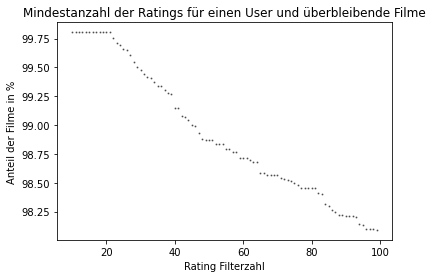

In [116]:
#Verbliebene Filme im Verhältnis zu zuvor ungefilterten Filmen
len(ratings_f.movieId.unique())/len(moviedata.movieId.unique()) * 100

x = []
y = []
for i in range(10,100):
  x.append(i)
  y.append(len(ratingsdata.groupby('userId').filter(lambda x: len(x) >= i).movieId.unique())/len(moviedata.movieId.unique()) * 100)
plt.scatter(x, y, s=1, c=(0,0,0), alpha=0.5)
plt.title('Mindestanzahl der Ratings für einen User und überbleibende Filme')
plt.xlabel('Rating Filterzahl')
plt.ylabel('Anteil der Filme in %')
plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


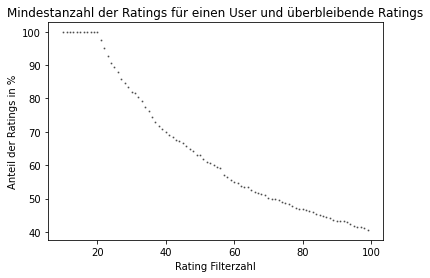

In [117]:
#Verbliebene User im Verhältnis zu zuvor ungefilterten Usern
len(ratings_f.userId.unique())/len(ratingsdata.userId.unique()) * 100

x = []
y = []
for i in range(10,100):
  x.append(i)
  y.append(len(ratingsdata.groupby('userId').filter(lambda x: len(x) >= i).userId.unique())/len(ratingsdata.userId.unique()) * 100)
plt.scatter(x, y, s=1, c=(0,0,0), alpha=0.5)
plt.title('Mindestanzahl der Ratings für einen User und überbleibende Ratings')
plt.xlabel('Rating Filterzahl')
plt.ylabel('Anteil der Ratings in %')
plt.show()

Anhand der Graphen ist erkennbar, dass mit zunehmender Mindestanzahl der Ratings für einen User der Anteil der verbliebenen Nutzer abnimmt. Bei ca. 70 Ratings als Mindestzahl halbiert sich der Anteil der User. Für den Anteil der Filme ergeben sich nahezu keine Veränderungen, sodass bei einer Mindestanzahl von 70 Ratings weiterhin knapp 99% der Filme erhalten bleiben.

# Content filtering (TF-IDF-vectorizing)

In [91]:
# Mergen von moviedata und tagsdata
movie_tags = pd.merge(moviedata, tagsdata, on='movieId', how='left')
movie_tags.head(3)

,movieId,title,genres,userId,tag,timestamp
0,movieId,title,genres,userId,tag,timestamp
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,336,pixar,1139045764
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,474,pixar,1137206825


In [93]:
# Erstellen einer Metadata-Spalte (Tags + Genre)
movie_tags.fillna("", inplace=True)
movie_tags = pd.DataFrame(movie_tags.groupby('movieId')['tag'].apply(
                             lambda x: "%s" % ' '.join(x)))
movie_tags_meta = pd.merge(moviedata, movie_tags, on='movieId', how='left')
movie_tags_meta ['metadata'] = movie_tags_meta[['tag', 'genres']].apply(
                             lambda x: ' '.join(x), axis = 1)
movie_tags_meta[['movieId','title','metadata']].head(3)

,movieId,title,metadata
0,movieId,title,tag genres
1,1,Toy Story (1995),pixar pixar fun Adventure|Animation|Children|C...
2,2,Jumanji (1995),fantasy magic board game Robin Williams game A...


In [120]:
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(movie_tags_meta['metadata'])
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), index=movie_tags_meta.index.tolist())
print(tfidf_df)

      0     1     2     3     4     5     ...  1671  1672  1673  1674  1675  1676
0      0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
1      0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
2      0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
3      0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
4      0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
...    ...   ...   ...   ...   ...   ...  ...   ...   ...   ...   ...   ...   ...
9738   0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
9739   0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
9740   0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
9741   0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0
9742   0.0   0.0   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0

[9743 rows x 16

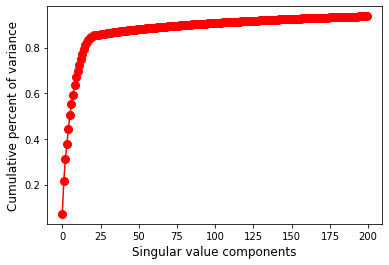

In [95]:
# Plotten der erklärten Varianz abhängig von der Anzahl der verwendeten Dimensionen
svd = TruncatedSVD(n_components=200)
latent_matrix = svd.fit_transform(tfidf_df)
explained = svd.explained_variance_ratio_.cumsum()
plt.plot(explained, '.-', ms = 16, color='red')
plt.xlabel('Singular value components', fontsize= 12)
plt.ylabel('Cumulative percent of variance', fontsize=12)        
plt.show()

In [122]:
#Festlegen der Anzahl der genutzten Dimensionen
n = 50
latent_matrix_1_df = pd.DataFrame(latent_matrix[:,0:n], index=Final.title.tolist())
latent_matrix_1_df.shape

(9743, 51)

In [126]:
#Erstellen der Empfehlungstablle
from sklearn.metrics.pairwise import cosine_similarity

#Basis-Film und Anzahl der Empfehlungen
selected_movie = 'Back to the Future Part II (1989)'
number_of_recommendations = 25

# Laden der TF-IDF-Vekoren aller Filme in Bezug auf den Basis-Film
array_selected = np.array(latent_matrix_1_df.loc[selected_movie]).reshape(1, -1)


# Berechnung der Ähnlichkeit des Inhalts des Basis-Films mit anderen Filmen aus dem movies.csv-Datensatz
score_similarity = cosine_similarity(latent_matrix_1_df, array_selected).reshape(-1)

# Abspeichern der ähnlichen Filme in einen Dataframe 
similar = {'content': score_similarity} 
similar_df = pd.DataFrame(similar, index = latent_matrix_1_df.index )

#Sortieren anhand der Übereinstimmung der Metadaten (Tags + Genres)
similar_df.sort_values('content', ascending=False, inplace=True)

#Ausgabe der Tabelle
print('Basierend auf dem Film ' + selected_movie + ' können folgende ' + str(number_of_recommendations) + ' Filme anhand ihrer Tags und Genres vorgeschlagen werden:')
similar_df[1:].head(number_of_recommendations)

Basierend auf dem Film Back to the Future Part II (1989) können folgende 25 Filme anhand ihrer Tags und Genres vorgeschlagen werden:


,content
Back to the Future (1985),1.000000
Back to the Future Part II (1989),1.000000
Stargate (1994),0.960174
Time Bandits (1981),0.957088
Bill & Ted's Bogus Journey (1991),0.957088
Primer (2004),0.938229
Star Trek (2009),0.933394
The Butterfly Effect (2004),0.895146
Terminator 2: Judgment Day (1991),0.870031
"Terminator, The (1984)",0.859406
